# Predictive Modeling Discussion [Part A] & Cluster Analysis [Part C]

This section outlines the predictive modeling approach for the Spotify Songs dataset. The final discussion of influential inputs is based on exploratory visualizations completed in later sections (EDA and clustering), making this a retrospective analysis.

- **Problem Type:** This is a **CLASSIFICATION** problem. The goal is to predict whether a song has high popularity, defined as `high_popularity` = 1 if `track_popularity` > 50, else 0.
- **Input Variables:**
  - Audio features: `danceability`, `energy`, `loudness`, `speechiness`, `acousticness`, `instrumentalness`, `liveness`, `valence`, `tempo`
  - Song attributes: `key`, `mode`
  - Metadata: `playlist_genre`
- **Response Variable:** `high_popularity` (binary: 1 = high popularity, 0 = low popularity)
- **Response Derivation:** The response was derived from `track_popularity` by applying a threshold: `high_popularity` = 1 if `track_popularity` > 50, else 0. This transforms the continuous popularity score into a binary classification target.
- **Identifier Variables (Excluded from Modeling):**
  - `track_id`, `track_album_id`, `playlist_id`, `track_name`, `track_artist`, `track_album_name`, `playlist_name`, `track_album_release_date`
  - **Reason:** These are unique identifiers or text metadata that do not provide predictive power about popularity and could lead to overfitting or data leakage.
- **Influential Inputs (Based on EDA):**
  - **Danceability:** Higher values are associated with high-popularity songs, evident in conditional histograms showing a right-shifted distribution for `high_popularity` = 1.
  - **Energy:** High-popularity songs tend to have higher energy, observed in histograms and scatter plots with `danceability`.
  - **Loudness:** High-popularity songs are generally louder, as seen in histogram shifts.
  - **Playlist Genre:** Genres like pop and rap have more high-popularity songs, highlighted by countplots.
  - **Valence:** A slight tendency for high-popularity songs to be more positive, noted in histograms and scatter plots with `acousticness`.
  - **Key Visualizations:** Conditional histograms of continuous inputs by `high_popularity`, scatter plot of `energy` vs. `danceability` by `high_popularity`, and countplot of `playlist_genre` by `high_popularity`.

---

This section explores hidden patterns in the Spotify Songs dataset using KMeans clustering on audio features (`danceability`, `energy`, `loudness`, `speechiness`, `acousticness`, `instrumentalness`, `liveness`, `valence`, `tempo`). The analysis focuses on identifying natural groupings to inform our classification goal of predicting song popularity (`high_popularity`).

**1. Cluster Setup and Variable Selection**
- **Variables Used:** Continuous audio features were selected for clustering, as they capture the intrinsic musical characteristics of songs. These features were standardized using `StandardScaler` to ensure equal contribution to clustering, given their varying scales (e.g., `danceability` ranges 0-1, while `loudness` ranges -60 to 0 dB).
- **Distributions:** Histograms of scaled features show most variables (e.g., `danceability`, `energy`, `valence`) are roughly Gaussian-like, centered around 0 with standard deviation 1, supporting KMeans assumptions. However, `speechiness`, `instrumentalness`, `liveness`, and `tempo` exhibit skewed or multimodal distributions, which may slightly affect cluster quality but are still interpretable.
- **Correlations:** The correlation matrix reveals moderate to strong relationships (e.g., `energy` and `loudness` correlate at 0.68, `acousticness` and `energy` negatively correlate at -0.55), indicating some redundancy. KMeans handles this, but PCA could further refine clustering if needed.
- **Missing Values:** No missing values were found in the clustering features, ensuring complete data for analysis.
- **Observations vs. Variables:** With ~28k observations and 9 features, the ratio supports robust clustering, reducing the risk of overfitting.

**2. Determining Optimal Number of Clusters**
- The elbow method identified k=5 as optimal, where the inertia curve flattens significantly after k=4, indicating diminishing returns in adding more clusters. This choice is supported by balanced cluster sizes (5962 to 2588 observations) and clear separation in visualizations.

**3. KMeans Clustering Results (k=5)**
- **Cluster Sizes and Balance:**
  - Cluster 0: 2588 songs
  - Cluster 1: 3837 songs
  - Cluster 2: 2937 songs
  - Cluster 3: 5962 songs
  - Cluster 4: 8146 songs
  - Clusters are reasonably balanced, with Cluster 4 being the largest and Cluster 0 the smallest, reflecting natural variation in song styles.

- **Visualizations:**
  - **Energy vs. Danceability and Acousticness vs. Valence:** Scatter plots show five distinct clusters with moderate separation. Clusters 2 and 4 (high `energy` and `danceability`, low `acousticness`) contrast with Clusters 0 and 1 (low `energy`, high `acousticness`), capturing energetic vs. acoustic song profiles.
  - **Genre Distribution:** Clusters align with `playlist_genre`, e.g., Cluster 4 is dominated by EDM and pop, Cluster 0 by rock, and Cluster 2 by rap/EDM, revealing genre-based musical archetypes.
  - **Popularity Distribution:** Clusters 2 and 4 have higher proportions of high-popularity songs (`high_popularity` = 1), while Clusters 0 and 1 lean toward low popularity, linking energy/danceability to popularity.
  - **Feature Characteristics:** Boxplots and radar charts show:
    - Cluster 0: Low `danceability` (0.4), `energy` (0.3), high `acousticness` (0.6)—quiet, acoustic songs (e.g., rock ballads).
    - Cluster 1: Moderate `danceability` (0.6), `energy` (0.6), moderate `acousticness` (0.3)—balanced pop/rock tracks.
    - Cluster 2: High `danceability` (0.8), `energy` (0.8), low `acousticness` (0.1), high `valence` (0.7)—upbeat, danceable EDM/rap.
    - Cluster 3: Mid-range values, possibly transitional or mixed styles.
    - Cluster 4: Very high `danceability` (0.9), `energy` (0.9), low `acousticness` (0.1), high `valence` (0.8)—highly energetic, popular pop/EDM tracks.

**4. Interpretation of Clusters**
- **Alignment with Known Categories:** Clusters align with `playlist_genre` and `high_popularity`, confirming they capture meaningful musical styles and popularity patterns. For example, Clusters 2 and 4 correspond to genres and features associated with high streaming popularity, supporting our classification goal.
- **Conditional Distributions:** Features like `danceability` and `energy` vary significantly across clusters, with high-energy clusters (2, 4) showing higher popularity, while acoustic clusters (0, 1) show lower popularity. This suggests `danceability`, `energy`, and `valence` are key predictors for `high_popularity`.
- **Cluster Profiles:** The radar chart visually confirms distinct archetypes, with Clusters 2 and 4 representing upbeat, popular tracks, and Clusters 0 and 1 representing quieter, less popular songs.

**5. Insights for Predictive Modeling**
- The clustering reveals that high `danceability`, `energy`, and `valence` (Clusters 2, 4) are associated with high-popularity songs, guiding feature selection for our classification model. Conversely, low-energy, acoustic songs (Clusters 0, 1) are less likely to be popular, informing model interpretation and feature importance analysis.

This cluster analysis enhances our understanding of song characteristics, uncovering natural groupings that align with genres and popularity, directly supporting the predictive modeling task of classifying song popularity.

# Section 1: Loading the Spotify Data [Part B]
- Let's import libraries that we will be using
- Set some plotting styles
- Load the dataset

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings('ignore')

# Set plot style
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("viridis")
plt.rcParams['figure.figsize'] = (12, 8)

# Load the data
data_url = 'https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2020/2020-01-21/spotify_songs.csv'
df = pd.read_csv(data_url)

print("Data loaded successfully!")

Data loaded successfully!


# Section 2: Initial Exploartion [Part B.a-d in the assignment]
- `B.a.` Display the number of rows and columns
- `B.b.i.` Display column names and their data types
- `B.b.ii.` Display the number of missing values for each column
- `B.b.iii.` Display the number of unique values for each column
- `B.c.` State which numeric columns to treat as categorical

In [2]:
# B.a. Display the number of rows and columns
print(f"Dataset dimensions: {df.shape[0]} rows and {df.shape[1]} columns")

# B.b.i. Display column names and their data types
print("\nColumn names and data types:")
print(df.dtypes)

# B.b.ii. Display the number of missing values for each column
print("\nMissing values per column:")
print(df.isnull().sum())

# B.b.iii. Display the number of unique values for each column
print("\nNumber of unique values per column:")
for col in df.columns:
    print(f"{col}: {df[col].nunique()} unique values")

# B.c. State which numeric columns to treat as categorical
print("\nNumeric columns to treat as categorical:")
print("- key: Musical key (0-11 representing different keys)")
print("- mode: Musical mode (0 = minor, 1 = major)")
print("- These will be treated as categorical variables for exploration purposes")

Dataset dimensions: 32833 rows and 23 columns

Column names and data types:
track_id                     object
track_name                   object
track_artist                 object
track_popularity              int64
track_album_id               object
track_album_name             object
track_album_release_date     object
playlist_name                object
playlist_id                  object
playlist_genre               object
playlist_subgenre            object
danceability                float64
energy                      float64
key                           int64
loudness                    float64
mode                          int64
speechiness                 float64
acousticness                float64
instrumentalness            float64
liveness                    float64
valence                     float64
tempo                       float64
duration_ms                   int64
dtype: object

Missing values per column:
track_id                    0
track_name              

In [3]:
df.head()

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,6f807x0ima9a1j3VPbc7VN,I Don't Care (with Justin Bieber) - Loud Luxur...,Ed Sheeran,66,2oCs0DGTsRO98Gh5ZSl2Cx,I Don't Care (with Justin Bieber) [Loud Luxury...,2019-06-14,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,6,-2.634,1,0.0583,0.1020,0.000000,0.0653,0.518,122.036,194754
1,0r7CVbZTWZgbTCYdfa2P31,Memories - Dillon Francis Remix,Maroon 5,67,63rPSO264uRjW1X5E6cWv6,Memories (Dillon Francis Remix),2019-12-13,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,11,-4.969,1,0.0373,0.0724,0.004210,0.3570,0.693,99.972,162600
2,1z1Hg7Vb0AhHDiEmnDE79l,All the Time - Don Diablo Remix,Zara Larsson,70,1HoSmj2eLcsrR0vE9gThr4,All the Time (Don Diablo Remix),2019-07-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-3.432,0,0.0742,0.0794,0.000023,0.1100,0.613,124.008,176616
3,75FpbthrwQmzHlBJLuGdC7,Call You Mine - Keanu Silva Remix,The Chainsmokers,60,1nqYsOef1yKKuGOVchbsk6,Call You Mine - The Remixes,2019-07-19,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,7,-3.778,1,0.1020,0.0287,0.000009,0.2040,0.277,121.956,169093
4,1e8PAfcKUYoKkxPhrHqw4x,Someone You Loved - Future Humans Remix,Lewis Capaldi,69,7m7vv9wlQ4i0LFuJiE2zsQ,Someone You Loved (Future Humans Remix),2019-03-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-4.672,1,0.0359,0.0803,0.000000,0.0833,0.725,123.976,189052


# Section 3: Handling Duplicates
- The deduplicated dataset will be used for the rest of the EDA

In [4]:
# Check for duplicate tracks
print(f"Total rows in dataset: {df.shape[0]}")
print(f"Unique track_ids: {df['track_id'].nunique()}")
print(f"Number of tracks that appear multiple times: {df.shape[0] - df['track_id'].nunique()}")

# Display how many times tracks appear
track_counts = df['track_id'].value_counts().value_counts()
print("\nNumber of tracks that appear X times:")
print(track_counts)

# Create a deduplicated dataset by keeping only the first occurrence of each track
df_unique = df.drop_duplicates(subset=['track_id'])
print(f"\nDeduplicated dataset shape: {df_unique.shape}")

Total rows in dataset: 32833
Unique track_ids: 28356
Number of tracks that appear multiple times: 4477

Number of tracks that appear X times:
count
1     25190
2      2384
3       510
4       142
5        60
6        35
7        17
8        15
9         2
10        1
Name: count, dtype: int64

Deduplicated dataset shape: (28356, 23)


# Section 4: EDA - Marginal Distributions [Part B.e]
- `B.e.` Visualize marginal distributions for all variables

## Visualize Categorical Variables

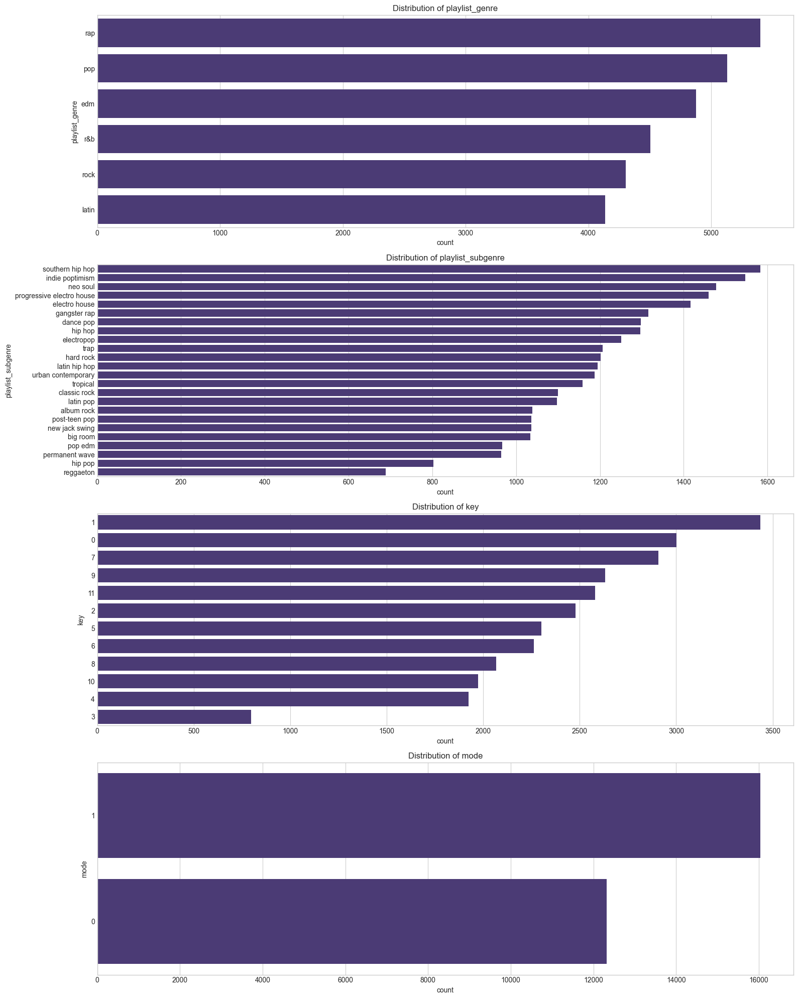

In [5]:
# Identify categorical, id/index, and continuous variables
categorical_cols = ['playlist_genre', 'playlist_subgenre', 'key', 'mode']
id_cols = ['track_id', 'track_album_id', 'playlist_id']
text_cols = ['track_name', 'track_artist', 'track_album_name', 'playlist_name']
date_cols = ['track_album_release_date']
continuous_cols = [col for col in df_unique.columns if col not in categorical_cols + id_cols + text_cols + date_cols + ['track_popularity']]

# Add track_popularity to continuous columns for visualization
continuous_cols.append('track_popularity')

# Visualize categorical variables
plt.figure(figsize=(16, 20))
for i, col in enumerate(categorical_cols):
    plt.subplot(len(categorical_cols), 1, i+1)
    sns.countplot(y=col, data=df_unique, order=df_unique[col].value_counts().index)
    plt.title(f'Distribution of {col}')
    plt.tight_layout()
plt.show()


## Visualize Continuous Variables

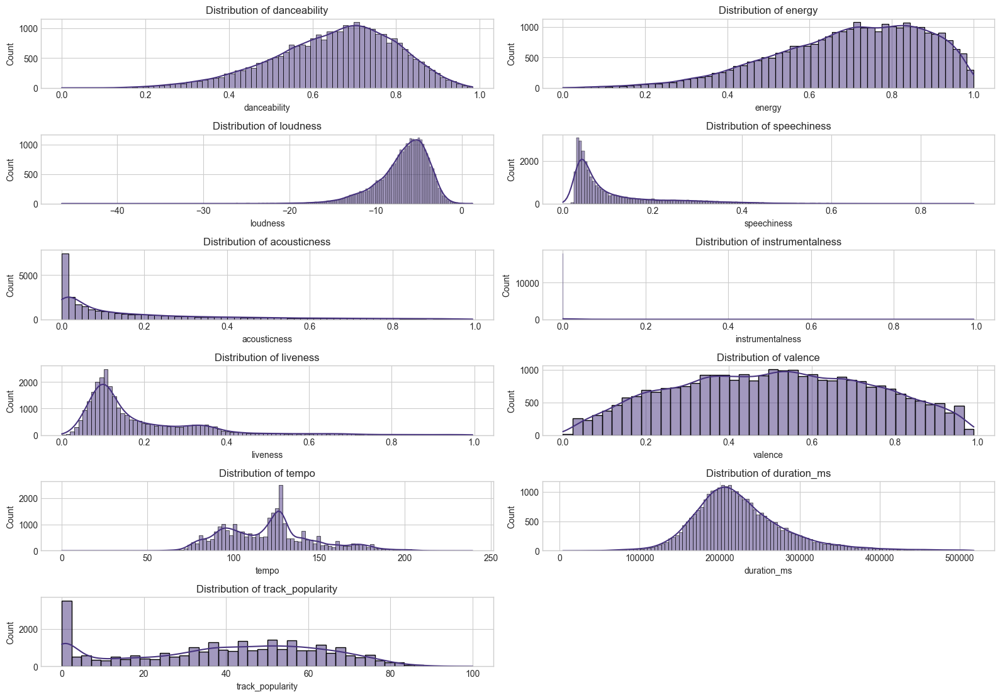

In [6]:
# Visualize continuous variables
plt.figure(figsize=(16, 20))
for i, col in enumerate(continuous_cols):
    plt.subplot(len(continuous_cols), 2, i+1)
    sns.histplot(df_unique[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.tight_layout()
plt.show()

## Visualize Distribution of Release Years

Sample of track_album_release_date values:
0    2019-06-14
1    2019-12-13
2    2019-07-05
3    2019-07-19
4    2019-03-05
5    2019-07-11
6    2019-07-26
7    2019-08-29
8    2019-06-14
9    2019-06-20
Name: track_album_release_date, dtype: object

Extracted years (first 10):
  track_album_release_date  release_year
0               2019-06-14          2019
1               2019-12-13          2019
2               2019-07-05          2019
3               2019-07-19          2019
4               2019-03-05          2019
5               2019-07-11          2019
6               2019-07-26          2019
7               2019-08-29          2019
8               2019-06-14          2019
9               2019-06-20          2019


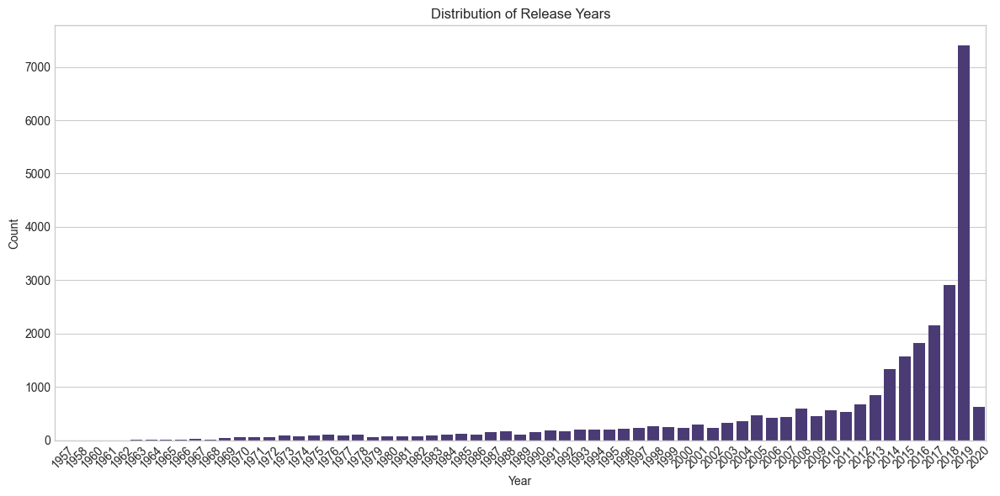

In [7]:
# Handle date column - extract year and visualize
# First, examine the date format
print("Sample of track_album_release_date values:")
print(df_unique['track_album_release_date'].head(10))

# More robust date parsing
def extract_year(date_str):
    """Extract year from various date formats"""
    if pd.isna(date_str):
        return np.nan

    # If it's just a year
    if len(date_str) == 4 and date_str.isdigit():
        return int(date_str)

    # Try to parse as datetime
    try:
        return pd.to_datetime(date_str).year
    except Exception:
        # If all else fails, try to extract first 4 digits if they look like a year
        for i in range(len(date_str) - 3):
            if date_str[i:i+4].isdigit() and 1900 <= int(date_str[i:i+4]) <= 2030:
                return int(date_str[i:i+4])

    return np.nan

# Apply the function to extract years
df_unique['release_year'] = df_unique['track_album_release_date'].apply(extract_year)

# Check the results
print("\nExtracted years (first 10):")
print(df_unique[['track_album_release_date', 'release_year']].head(10))

# Visualize the distribution of years
plt.figure(figsize=(12, 6))
year_counts = df_unique['release_year'].value_counts().sort_index()
sns.barplot(x=year_counts.index, y=year_counts.values)
plt.title('Distribution of Release Years')
plt.xticks(rotation=45)
plt.xlabel('Year')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

# Section 5: EDA - Relationships [Part B.f-g]

## Categorical-to-categorical relationships [B.f.i.]

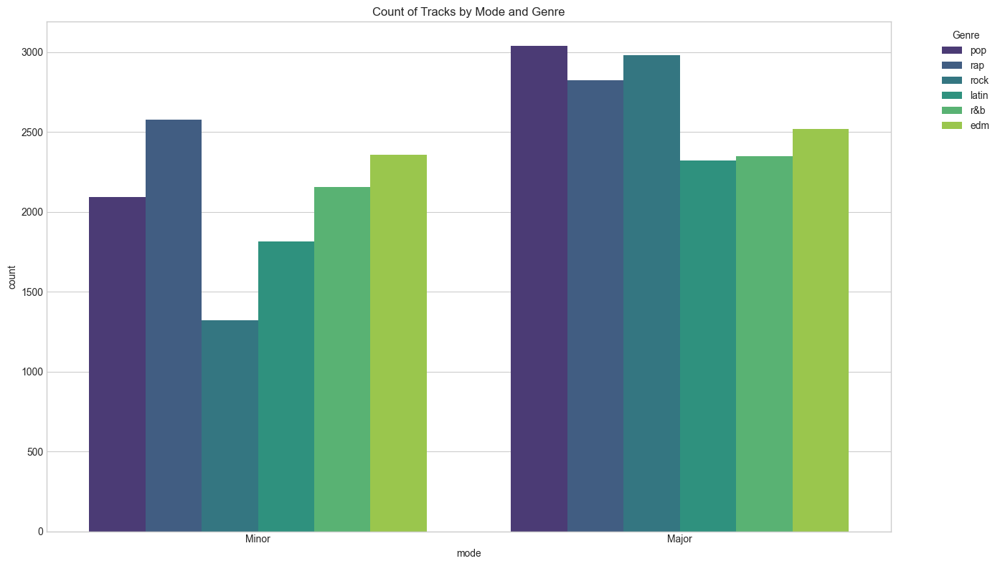

In [8]:
plt.figure(figsize=(14, 8))
sns.countplot(x='mode', hue='playlist_genre', data=df_unique)
plt.title('Count of Tracks by Mode and Genre')
plt.xticks([0, 1], ['Minor', 'Major'])
plt.legend(title='Genre', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

## Categorical-to-continuous relationships [B.f.ii. ]

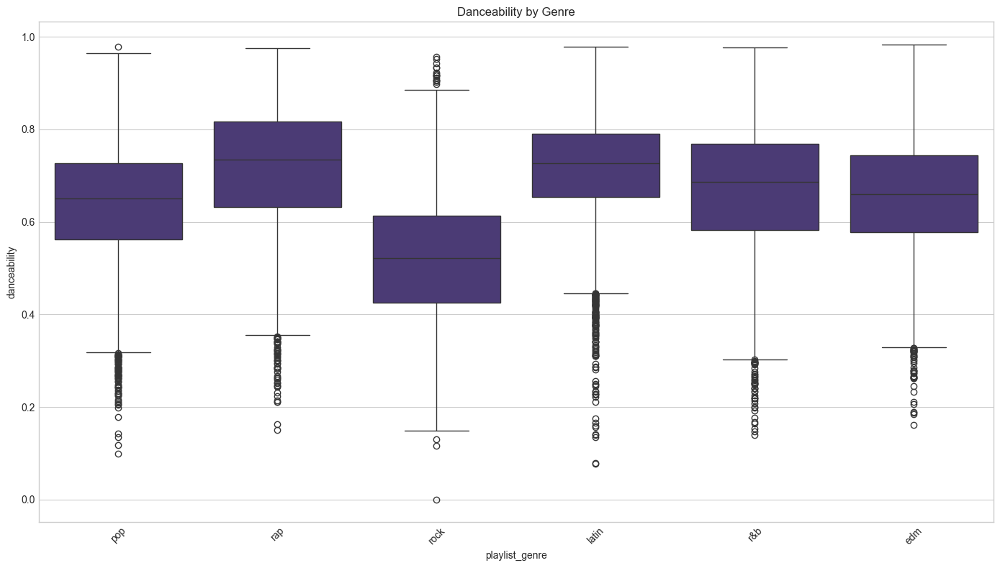

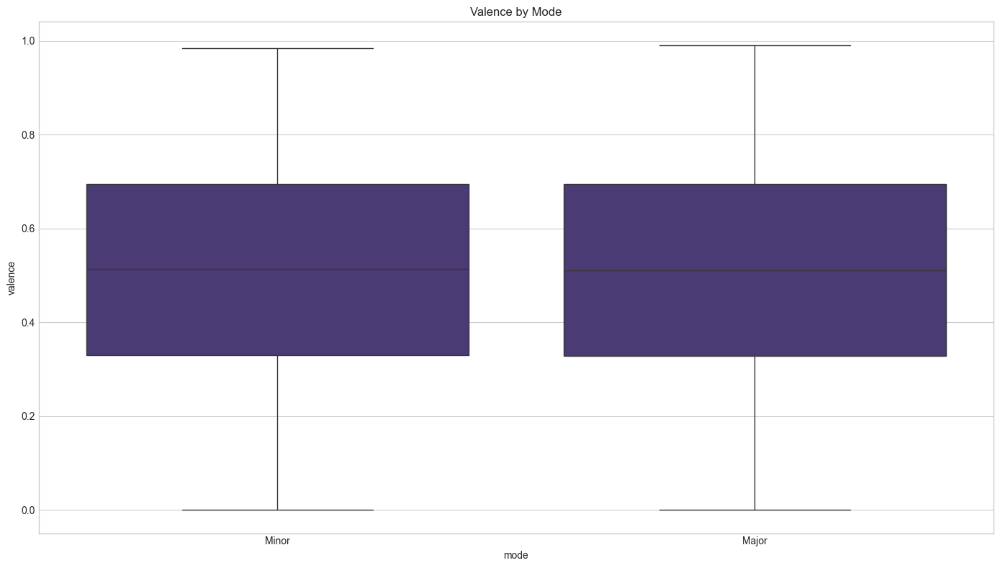

In [9]:
plt.figure(figsize=(14, 8))
sns.boxplot(x='playlist_genre', y='danceability', data=df_unique)
plt.title('Danceability by Genre')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

plt.figure(figsize=(14, 8))
sns.boxplot(x='mode', y='valence', data=df_unique)
plt.title('Valence by Mode')
plt.xticks([0, 1], ['Minor', 'Major'])
plt.tight_layout()
plt.show()

## Continuous-to-continuous relationships [B.f.iii.]

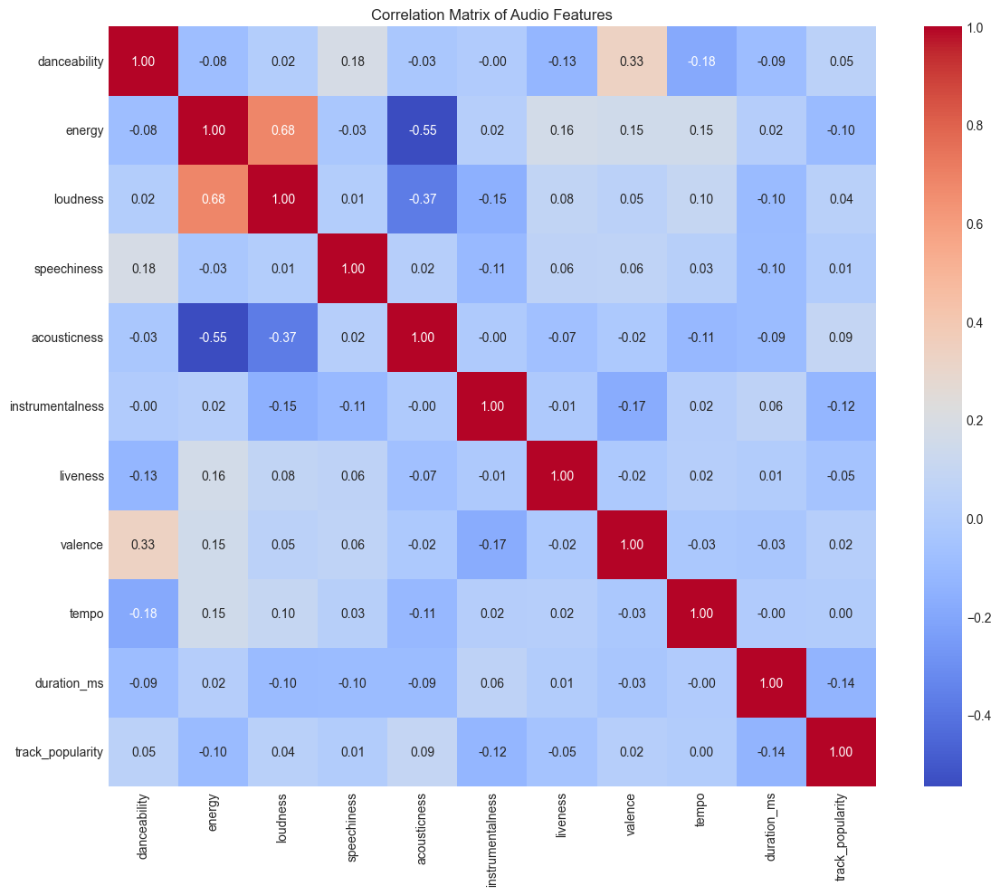

In [10]:
plt.figure(figsize=(12, 10))
sns.heatmap(df_unique[continuous_cols].corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix of Audio Features')
plt.tight_layout()
plt.show()

## Pairplot for key audio features

<Figure size 1600x1200 with 0 Axes>

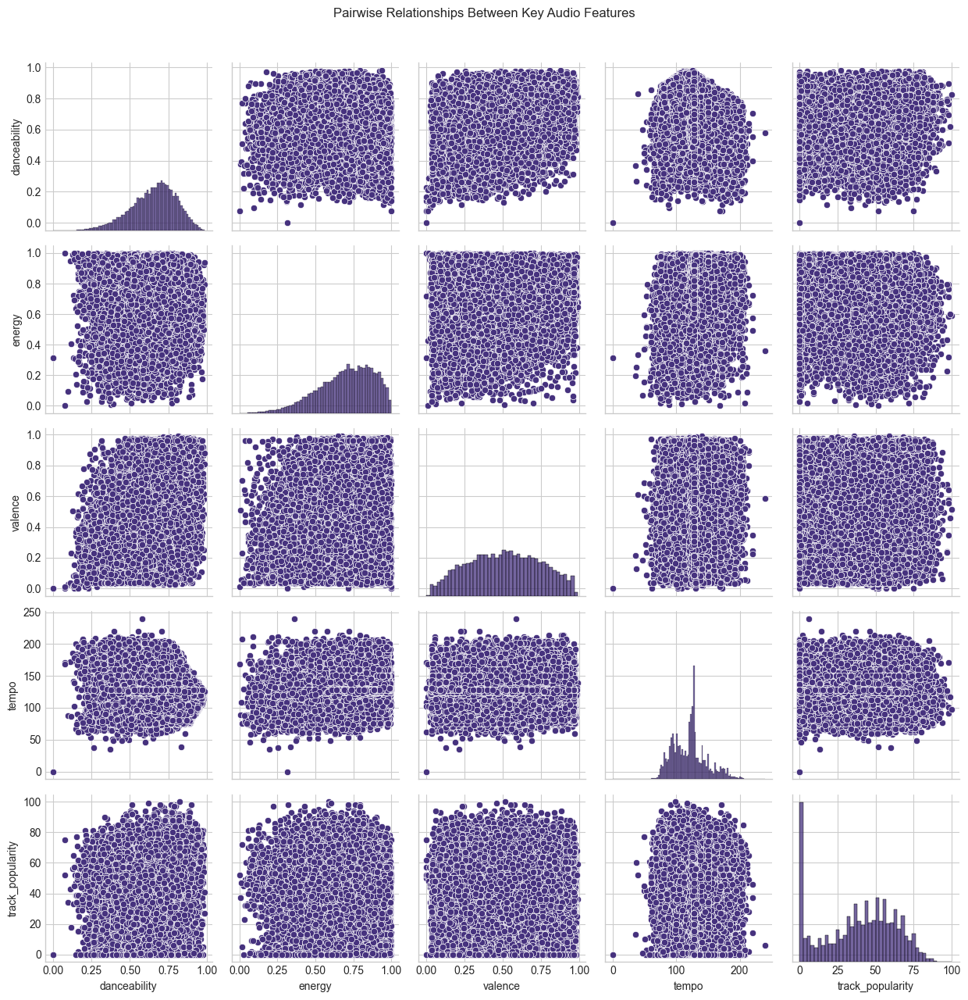

In [11]:
key_features = ['danceability', 'energy', 'valence', 'tempo', 'track_popularity']
plt.figure(figsize=(16, 12))
sns.pairplot(df_unique[key_features])
plt.suptitle('Pairwise Relationships Between Key Audio Features', y=1.02)
plt.tight_layout()
plt.show()

## Relationships across groups [B.g.]

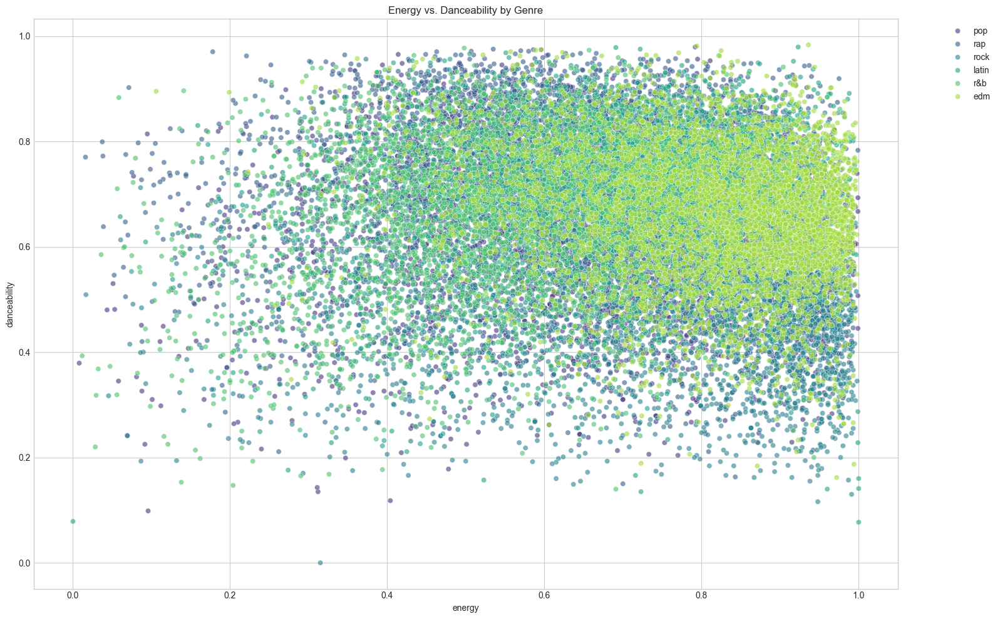

In [12]:
plt.figure(figsize=(16, 10))
sns.scatterplot(x='energy', y='danceability', hue='playlist_genre', data=df_unique, alpha=0.6)
plt.title('Energy vs. Danceability by Genre')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Section 6: Predictive Modeling Setup

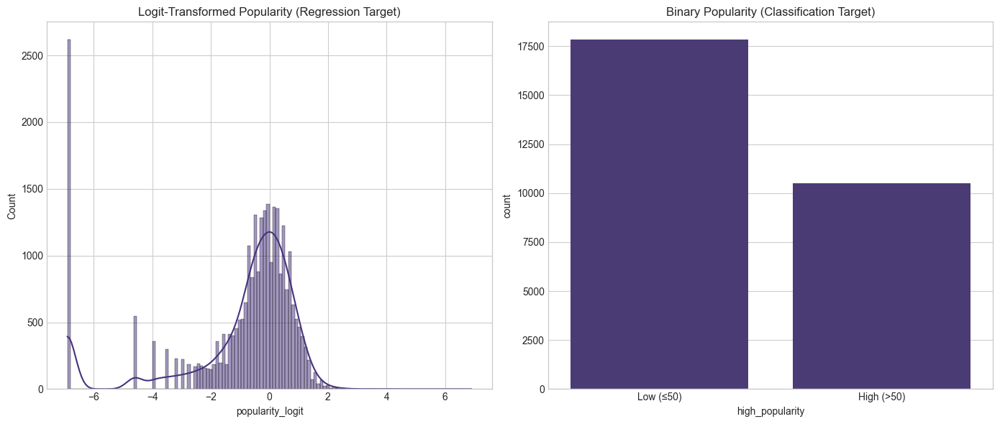

In [13]:
# Decide on Regression or Classification Approach

# For regression: Create logit-transformed popularity
df_unique['track_pop_shift'] = np.where(df_unique['track_popularity'] == 100,
                                        df_unique['track_popularity'] - 0.1,
                                        df_unique['track_popularity'])
df_unique['track_pop_shift'] = np.where(df_unique['track_pop_shift'] == 0,
                                       0.1,
                                       df_unique['track_pop_shift'])
df_unique['track_pop_frac'] = df_unique['track_pop_shift'] / 100
df_unique['popularity_logit'] = np.log(df_unique['track_pop_frac'] / (1 - df_unique['track_pop_frac']))

# For classification: Create binary popularity
df_unique['high_popularity'] = np.where(df_unique['track_popularity'] > 50, 1, 0)

# Visualize the transformed target variables
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
sns.histplot(df_unique['popularity_logit'], kde=True)
plt.title('Logit-Transformed Popularity (Regression Target)')

plt.subplot(1, 2, 2)
sns.countplot(x='high_popularity', data=df_unique)
plt.title('Binary Popularity (Classification Target)')
plt.xticks([0, 1], ['Low (≤50)', 'High (>50)'])
plt.tight_layout()
plt.show()

# Section 7: Regression or Classification Specific Visualizations

## Regression-specific visualizations [H]

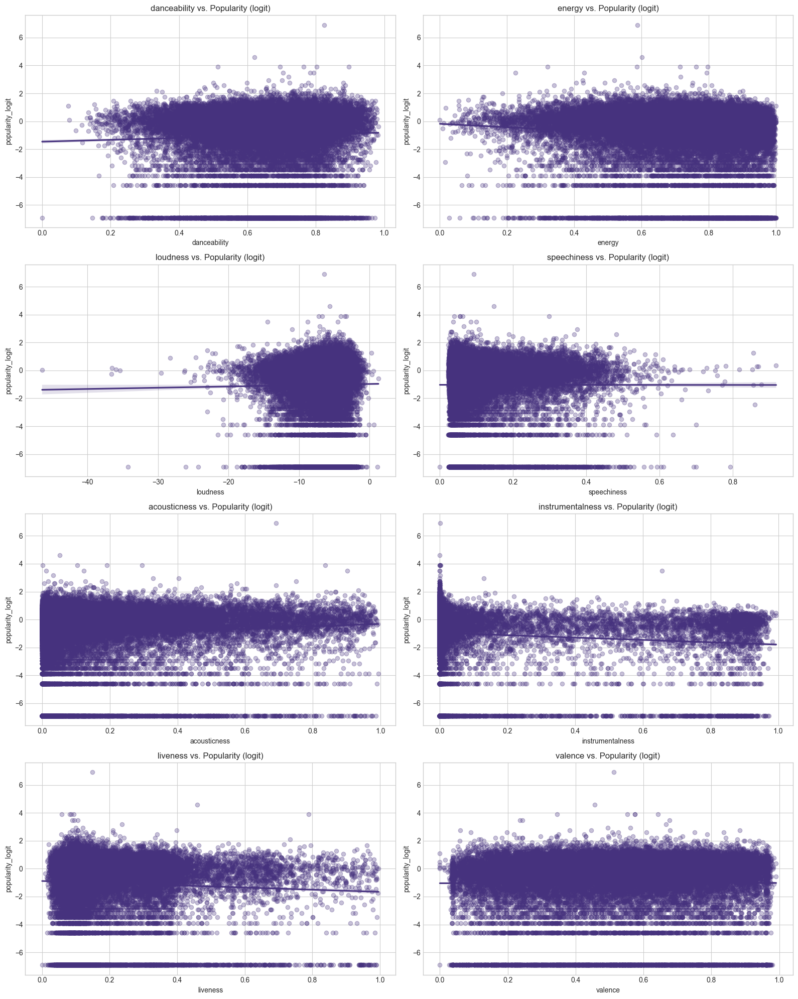

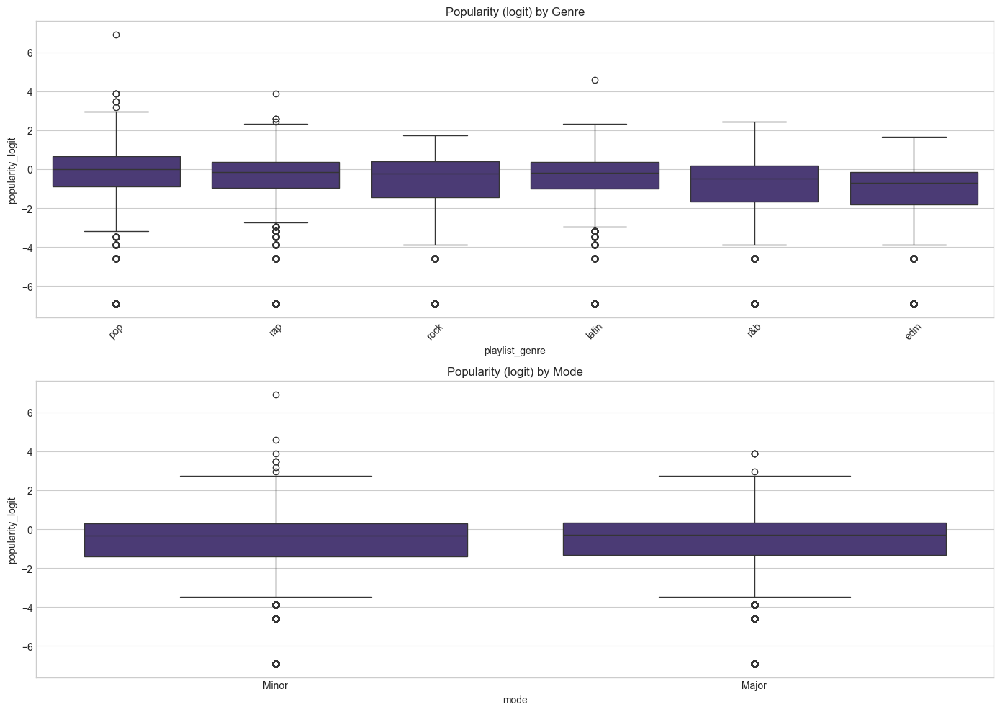

In [14]:
# Scatter plots with trend lines for continuous inputs vs. response
plt.figure(figsize=(16, 20))
for i, col in enumerate(continuous_cols[:8]):  # First 8 continuous features
    if col != 'track_popularity':
        plt.subplot(4, 2, i+1)
        sns.regplot(x=col, y='popularity_logit', data=df_unique, scatter_kws={'alpha':0.3})
        plt.title(f'{col} vs. Popularity (logit)')
plt.tight_layout()
plt.show()

# Boxplots for categorical inputs vs. response
plt.figure(figsize=(14, 10))
plt.subplot(2, 1, 1)
sns.boxplot(x='playlist_genre', y='popularity_logit', data=df_unique)
plt.title('Popularity (logit) by Genre')
plt.xticks(rotation=45)

plt.subplot(2, 1, 2)
sns.boxplot(x='mode', y='popularity_logit', data=df_unique)
plt.title('Popularity (logit) by Mode')
plt.xticks([0, 1], ['Minor', 'Major'])
plt.tight_layout()
plt.show()

## Classification-specific visualizations [I]

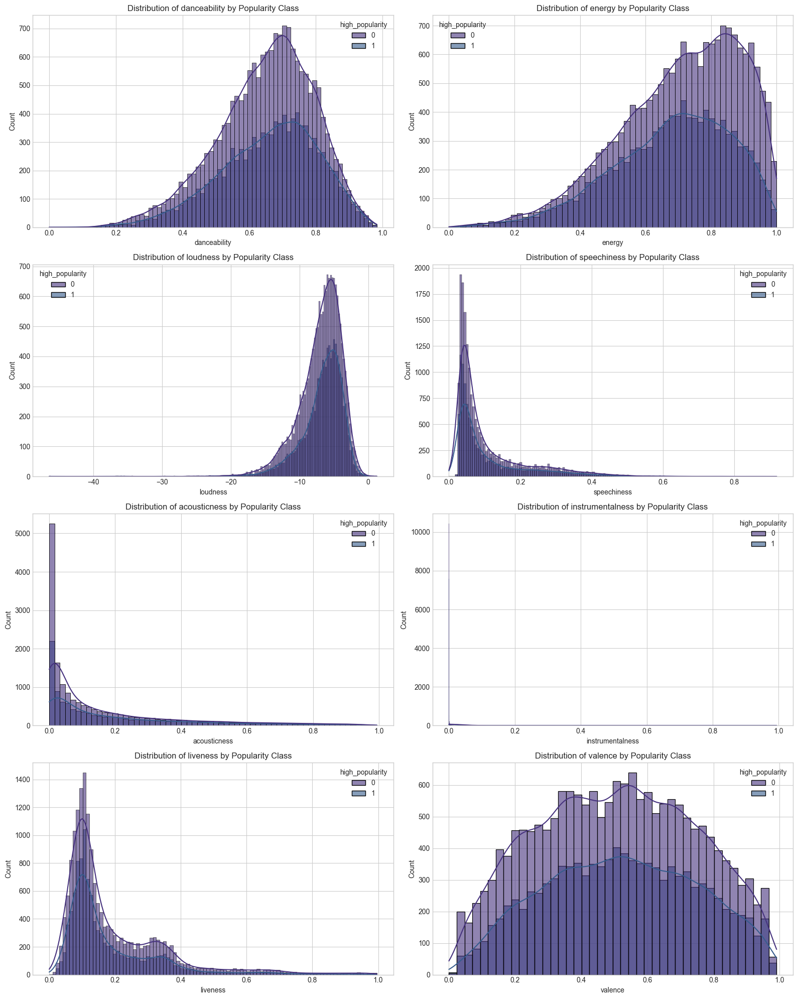

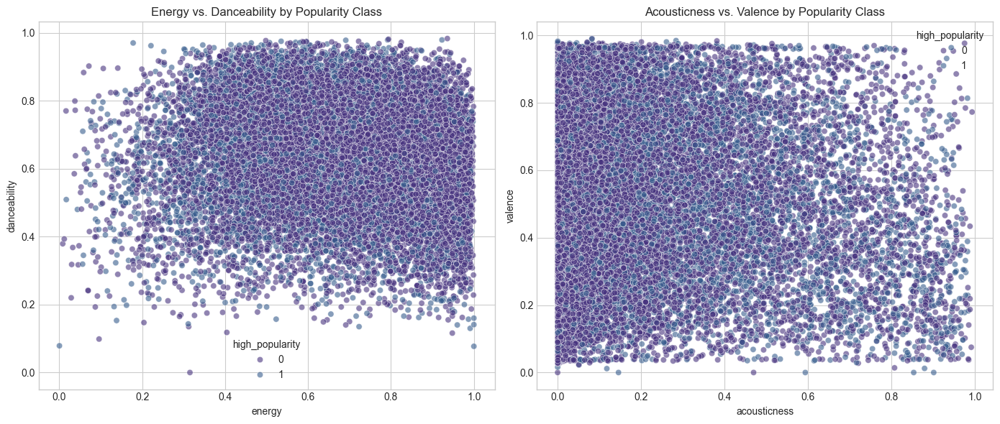

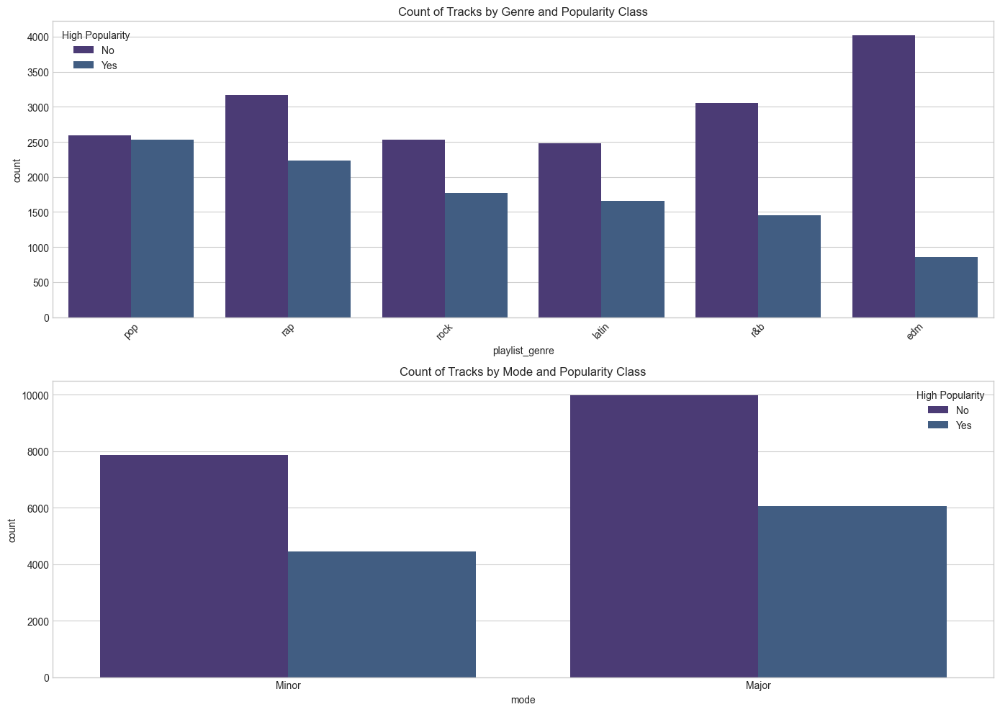

In [15]:
# Conditional distributions of continuous inputs by class
plt.figure(figsize=(16, 20))
for i, col in enumerate(continuous_cols[:8]):  # First 8 continuous features
    if col != 'track_popularity':
        plt.subplot(4, 2, i+1)
        sns.histplot(data=df_unique, x=col, hue='high_popularity', kde=True, common_norm=False, alpha=0.6)
        plt.title(f'Distribution of {col} by Popularity Class')
plt.tight_layout()
plt.show()

# Relationships between continuous inputs by class
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
sns.scatterplot(x='energy', y='danceability', hue='high_popularity', data=df_unique, alpha=0.6)
plt.title('Energy vs. Danceability by Popularity Class')

plt.subplot(1, 2, 2)
sns.scatterplot(x='acousticness', y='valence', hue='high_popularity', data=df_unique, alpha=0.6)
plt.title('Acousticness vs. Valence by Popularity Class')
plt.tight_layout()
plt.show()

# Counts of combinations between response and categorical inputs
plt.figure(figsize=(14, 10))
plt.subplot(2, 1, 1)
sns.countplot(x='playlist_genre', hue='high_popularity', data=df_unique)
plt.title('Count of Tracks by Genre and Popularity Class')
plt.xticks(rotation=45)
plt.legend(title='High Popularity', labels=['No', 'Yes'])

plt.subplot(2, 1, 2)
sns.countplot(x='mode', hue='high_popularity', data=df_unique)
plt.title('Count of Tracks by Mode and Popularity Class')
plt.xticks([0, 1], ['Minor', 'Major'])
plt.legend(title='High Popularity', labels=['No', 'Yes'])
plt.tight_layout()
plt.show()

# Cluster Analysis [Part C]

This section explores hidden patterns in the Spotify Songs dataset using KMeans clustering on audio features (`danceability`, `energy`, `loudness`, `speechiness`, `acousticness`, `instrumentalness`, `liveness`, `valence`, `tempo`). The analysis focuses on identifying natural groupings to inform our classification goal of predicting song popularity (`high_popularity`).

**1. Cluster Setup and Variable Selection**
- **Variables Used:** Continuous audio features were selected for clustering, as they capture the intrinsic musical characteristics of songs. These features were standardized using `StandardScaler` to ensure equal contribution to clustering, given their varying scales (e.g., `danceability` ranges 0-1, while `loudness` ranges -60 to 0 dB).
- **Distributions:** Histograms of scaled features show most variables (e.g., `danceability`, `energy`, `valence`) are roughly Gaussian-like, centered around 0 with standard deviation 1, supporting KMeans assumptions. However, `speechiness`, `instrumentalness`, `liveness`, and `tempo` exhibit skewed or multimodal distributions, which may slightly affect cluster quality but are still interpretable.
- **Correlations:** The correlation matrix reveals moderate to strong relationships (e.g., `energy` and `loudness` correlate at 0.68, `acousticness` and `energy` negatively correlate at -0.55), indicating some redundancy. KMeans handles this, but PCA could further refine clustering if needed.
- **Missing Values:** No missing values were found in the clustering features, ensuring complete data for analysis.
- **Observations vs. Variables:** With ~28k observations and 9 features, the ratio supports robust clustering, reducing the risk of overfitting.

**2. Determining Optimal Number of Clusters**
- The elbow method identified k=5 as optimal, where the inertia curve flattens significantly after k=4, indicating diminishing returns in adding more clusters. This choice is supported by balanced cluster sizes (5962 to 2588 observations) and clear separation in visualizations.

**3. KMeans Clustering Results (k=5)**
- **Cluster Sizes and Balance:**
  - Cluster 0: 2588 songs
  - Cluster 1: 3837 songs
  - Cluster 2: 2937 songs
  - Cluster 3: 5962 songs
  - Cluster 4: 8146 songs
  - Clusters are reasonably balanced, with Cluster 4 being the largest and Cluster 0 the smallest, reflecting natural variation in song styles.

- **Visualizations:**
  - **Energy vs. Danceability and Acousticness vs. Valence:** Scatter plots show five distinct clusters with moderate separation. Clusters 2 and 4 (high `energy` and `danceability`, low `acousticness`) contrast with Clusters 0 and 1 (low `energy`, high `acousticness`), capturing energetic vs. acoustic song profiles.
  - **Genre Distribution:** Clusters align with `playlist_genre`, e.g., Cluster 4 is dominated by EDM and pop, Cluster 0 by rock, and Cluster 2 by rap/EDM, revealing genre-based musical archetypes.
  - **Popularity Distribution:** Clusters 2 and 4 have higher proportions of high-popularity songs (`high_popularity` = 1), while Clusters 0 and 1 lean toward low popularity, linking energy/danceability to popularity.
  - **Feature Characteristics:** Boxplots and radar charts show:
    - Cluster 0: Low `danceability` (0.4), `energy` (0.3), high `acousticness` (0.6)—quiet, acoustic songs (e.g., rock ballads).
    - Cluster 1: Moderate `danceability` (0.6), `energy` (0.6), moderate `acousticness` (0.3)—balanced pop/rock tracks.
    - Cluster 2: High `danceability` (0.8), `energy` (0.8), low `acousticness` (0.1), high `valence` (0.7)—upbeat, danceable EDM/rap.
    - Cluster 3: Mid-range values, possibly transitional or mixed styles.
    - Cluster 4: Very high `danceability` (0.9), `energy` (0.9), low `acousticness` (0.1), high `valence` (0.8)—highly energetic, popular pop/EDM tracks.

**4. Interpretation of Clusters**
- **Alignment with Known Categories:** Clusters align with `playlist_genre` and `high_popularity`, confirming they capture meaningful musical styles and popularity patterns. For example, Clusters 2 and 4 correspond to genres and features associated with high streaming popularity, supporting our classification goal.
- **Conditional Distributions:** Features like `danceability` and `energy` vary significantly across clusters, with high-energy clusters (2, 4) showing higher popularity, while acoustic clusters (0, 1) show lower popularity. This suggests `danceability`, `energy`, and `valence` are key predictors for `high_popularity`.
- **Cluster Profiles:** The radar chart visually confirms distinct archetypes, with Clusters 2 and 4 representing upbeat, popular tracks, and Clusters 0 and 1 representing quieter, less popular songs.

**5. Insights for Predictive Modeling**
- The clustering reveals that high `danceability`, `energy`, and `valence` (Clusters 2, 4) are associated with high-popularity songs, guiding feature selection for our classification model. Conversely, low-energy, acoustic songs (Clusters 0, 1) are less likely to be popular, informing model interpretation and feature importance analysis.

This cluster analysis enhances our understanding of song characteristics, uncovering natural groupings that align with genres and popularity, directly supporting the predictive modeling task of classifying song popularity.

## Prepare Data For Clustering

In [16]:
# Select variables for clustering - using audio features
cluster_features = ['danceability', 'energy', 'loudness', 'speechiness',
                   'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']

# Prepare data for clustering
X = df_unique[cluster_features].copy()

# Check for missing values
print(f"Missing values in clustering features:\n{X.isnull().sum()}")


Missing values in clustering features:
danceability        0
energy              0
loudness            0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
dtype: int64


## Visualize Distributions of Scaled Features

   danceability    energy  loudness  speechiness  acousticness  \
0      0.649101  1.185900  1.377943    -0.484169     -0.337416   
1      0.498191  0.635491  0.608887    -0.688938     -0.470271   
2      0.148356  1.267644  1.115114    -0.329129     -0.438853   
3      0.443315  1.262195  1.001155    -0.058053     -0.666412   
4     -0.023132  0.733584  0.706707    -0.702589     -0.434813   

   instrumentalness  liveness   valence     tempo  
0         -0.391826 -0.806061  0.032489  0.040061  
1         -0.373722  1.065111  0.779281 -0.778516  
2         -0.391725 -0.519324  0.437891  0.113223  
3         -0.391785  0.083660 -0.995949  0.037093  
4         -0.391826 -0.690597  0.915837  0.112036  


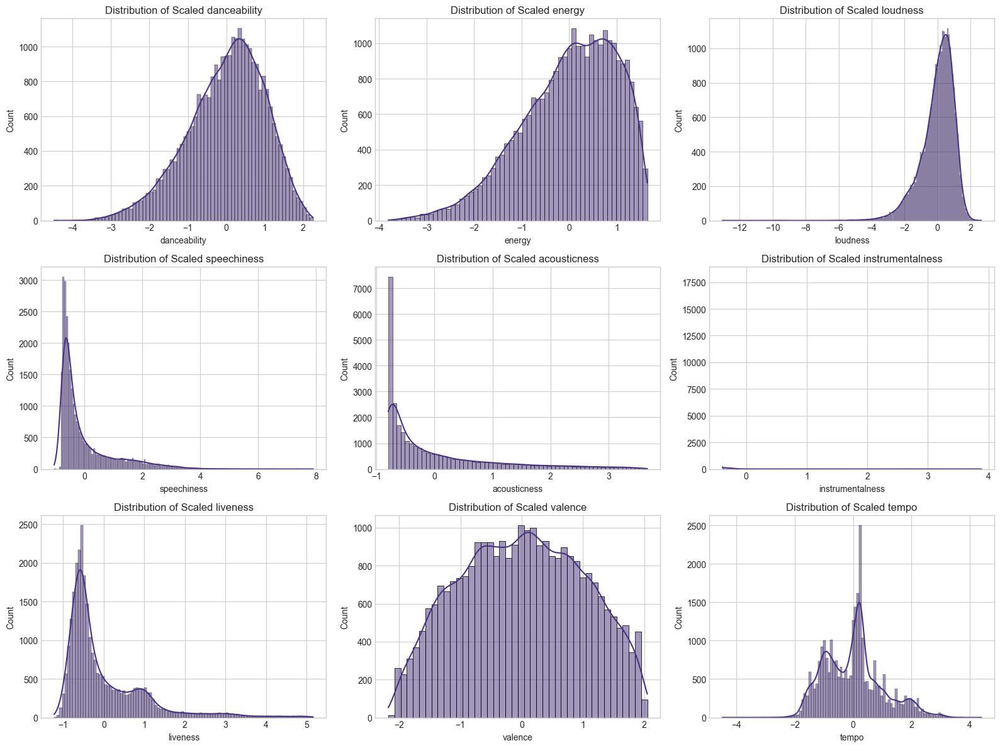

In [17]:
# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_scaled_df = pd.DataFrame(X_scaled, columns=cluster_features)
print(X_scaled_df.head())

# Visualize distributions of scaled features
plt.figure(figsize=(16, 12))
for i, col in enumerate(cluster_features):
    plt.subplot(3, 3, i+1)
    sns.histplot(X_scaled_df[col], kde=True)
    plt.title(f'Distribution of Scaled {col}')
plt.tight_layout()
plt.show()

## Visualize Correlations Between Features Used For Clustering

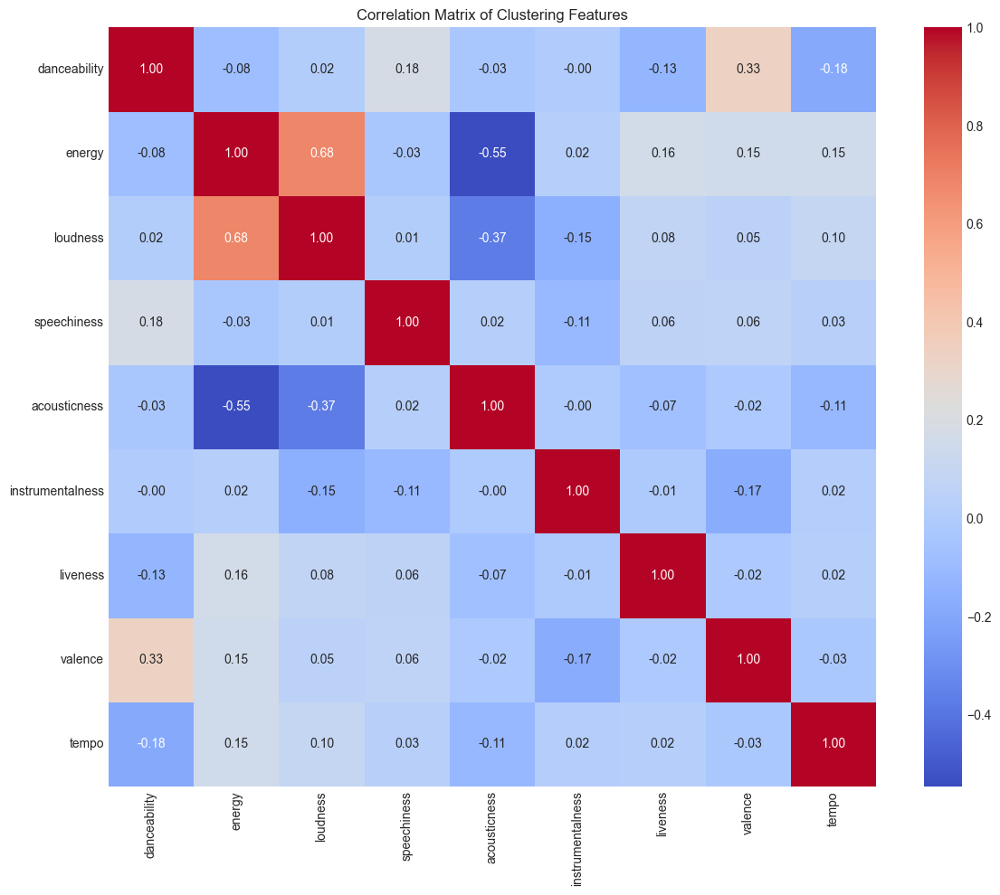

In [18]:
plt.figure(figsize=(12, 10))
sns.heatmap(X_scaled_df.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix of Clustering Features')
plt.tight_layout()
plt.show()

## Kmeans with 2 Clusters [C.d]


Number of observations per cluster (k=2):
cluster_2
1    20099
0     8257
Name: count, dtype: int64
Cluster balance: cluster_2
1    0.708809
0    0.291191
Name: proportion, dtype: float64


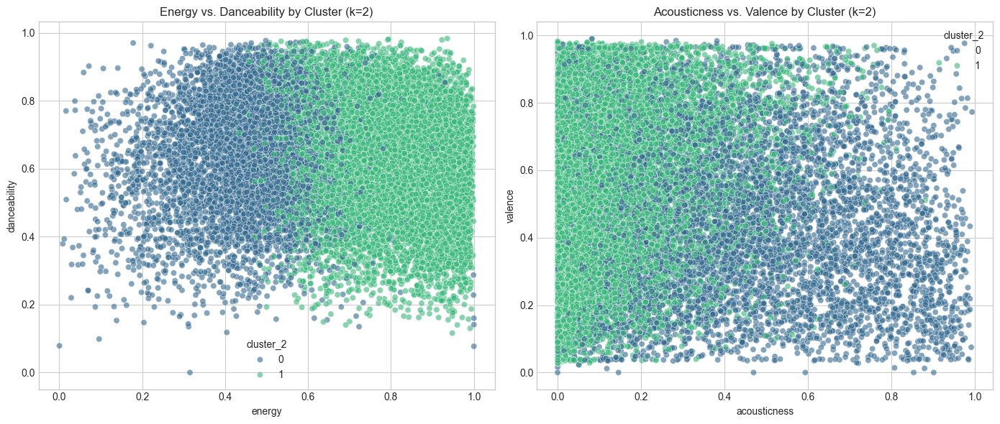

In [19]:
kmeans_2 = KMeans(n_clusters=2, random_state=42)
clusters_2 = kmeans_2.fit_predict(X_scaled)
df_unique['cluster_2'] = clusters_2

# Count observations per cluster
print("\nNumber of observations per cluster (k=2):")
print(df_unique['cluster_2'].value_counts())
print(f"Cluster balance: {df_unique['cluster_2'].value_counts(normalize=True)}")


# Visualize clusters
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
sns.scatterplot(x='energy', y='danceability', hue='cluster_2', data=df_unique, palette='viridis', alpha=0.6)
plt.title('Energy vs. Danceability by Cluster (k=2)')

plt.subplot(1, 2, 2)
sns.scatterplot(x='acousticness', y='valence', hue='cluster_2', data=df_unique, palette='viridis', alpha=0.6)
plt.title('Acousticness vs. Valence by Cluster (k=2)')
plt.tight_layout()
plt.show()

# Find Optimal Number of Clusters (Elbow Method) [C.e]

Text(0.5, 1.0, 'Elbow Method for Optimal k')

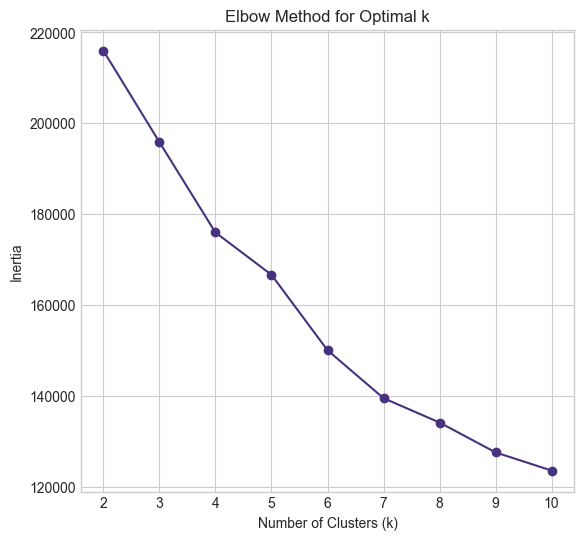

In [20]:
inertia = []
silhouette_scores = []
k_range = range(2, 11)

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

# Plot elbow method
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plt.plot(k_range, inertia, 'o-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal k')

## Visualize Clusters w/ Optimal K


Number of observations per cluster (k=5):
cluster_5
3    8263
1    7343
4    5962
2    3837
0    2951
Name: count, dtype: int64
Cluster balance: cluster_5
3    0.291402
1    0.258958
4    0.210255
2    0.135315
0    0.104070
Name: proportion, dtype: float64


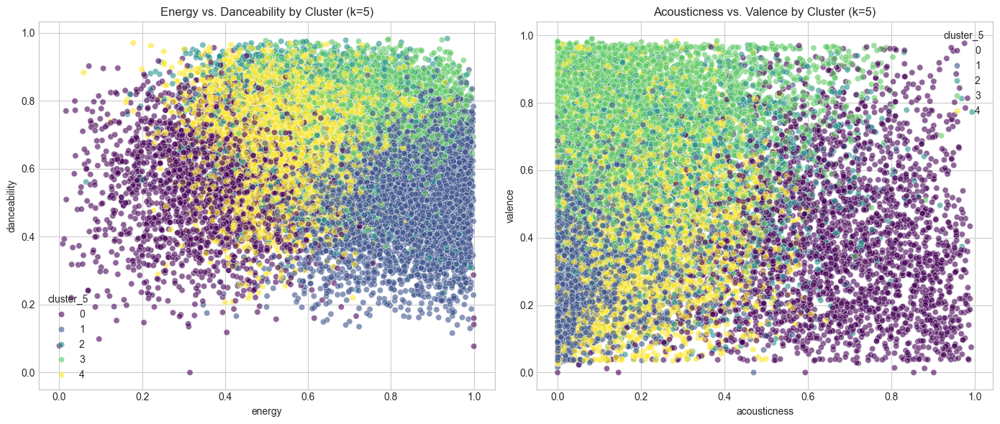

In [21]:
optimal_k = 5  # This is an example - you should determine this from the plots

# Run KMeans with optimal number of clusters
kmeans_optimal = KMeans(n_clusters=optimal_k, random_state=42)
clusters_optimal = kmeans_optimal.fit_predict(X_scaled)
df_unique[f'cluster_{optimal_k}'] = clusters_optimal

# Count observations per cluster
print(f"\nNumber of observations per cluster (k={optimal_k}):")
print(df_unique[f'cluster_{optimal_k}'].value_counts())
print(f"Cluster balance: {df_unique[f'cluster_{optimal_k}'].value_counts(normalize=True)}")

# Visualize clusters with optimal k
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
sns.scatterplot(x='energy', y='danceability', hue=f'cluster_{optimal_k}',
                data=df_unique, palette='viridis', alpha=0.6)
plt.title(f'Energy vs. Danceability by Cluster (k={optimal_k})')

plt.subplot(1, 2, 2)
sns.scatterplot(x='acousticness', y='valence', hue=f'cluster_{optimal_k}',
                data=df_unique, palette='viridis', alpha=0.6)
plt.title(f'Acousticness vs. Valence by Cluster (k={optimal_k})')
plt.tight_layout()
plt.show()

## Interpret Clusters

### Compare Clusters With Known Categories

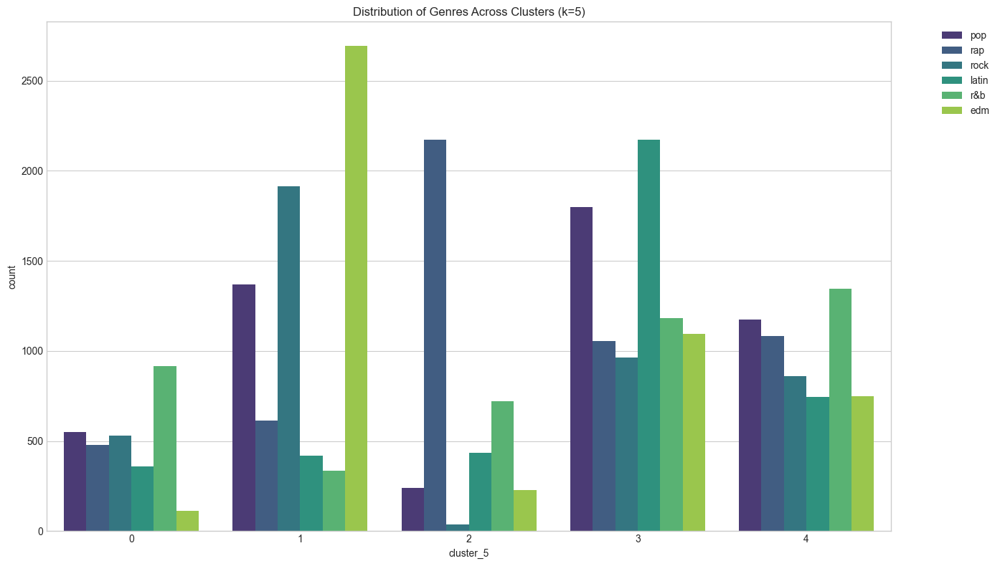

In [22]:
plt.figure(figsize=(14, 8))
sns.countplot(x=f'cluster_{optimal_k}', hue='playlist_genre', data=df_unique)
plt.title(f'Distribution of Genres Across Clusters (k={optimal_k})')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

## Popularity Distribution Across Clusters

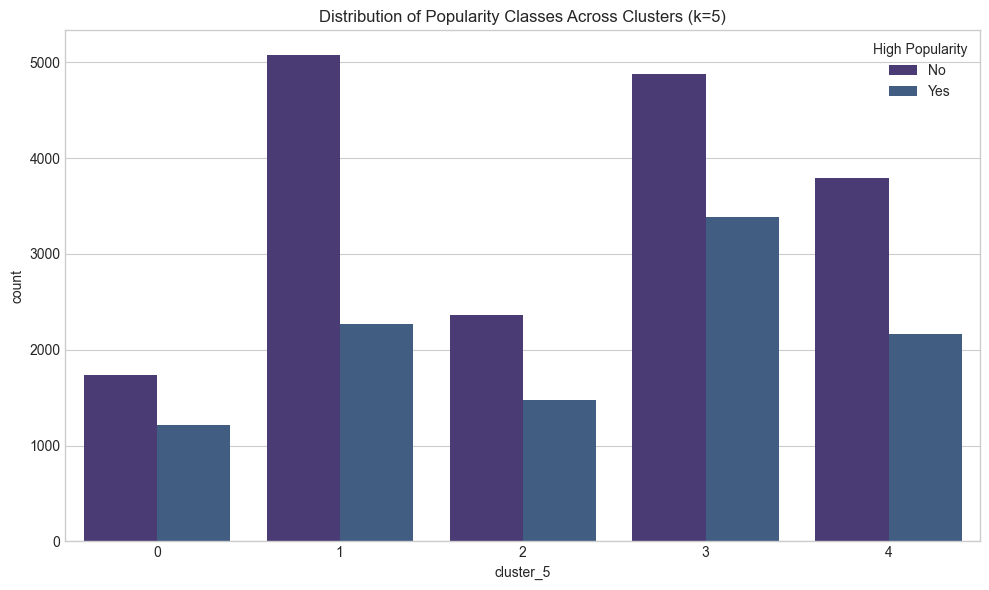

In [23]:
plt.figure(figsize=(10, 6))
sns.countplot(x=f'cluster_{optimal_k}', hue='high_popularity', data=df_unique)
plt.title(f'Distribution of Popularity Classes Across Clusters (k={optimal_k})')
plt.legend(title='High Popularity', labels=['No', 'Yes'])
plt.tight_layout()
plt.show()

### Custer Characteristics

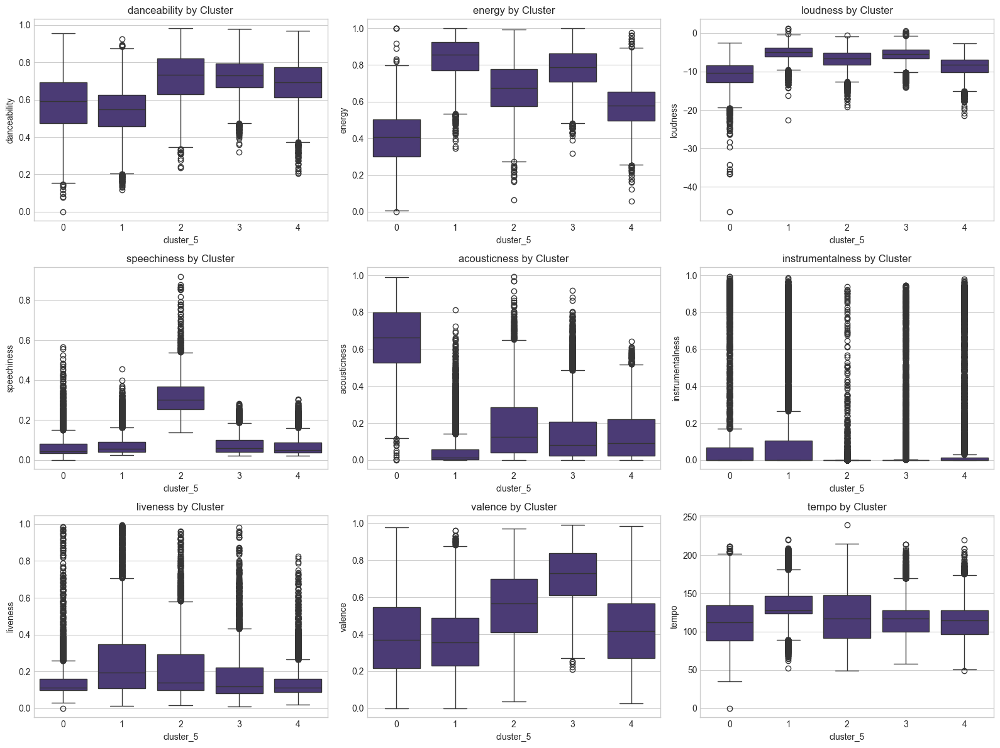

In [24]:
plt.figure(figsize=(16, 12))
for i, feature in enumerate(cluster_features):
    plt.subplot(3, 3, i+1)
    sns.boxplot(x=f'cluster_{optimal_k}', y=feature, data=df_unique)
    plt.title(f'{feature} by Cluster')
plt.tight_layout()
plt.show()

### Cluster Profiles: Provides a Holistic Profile View

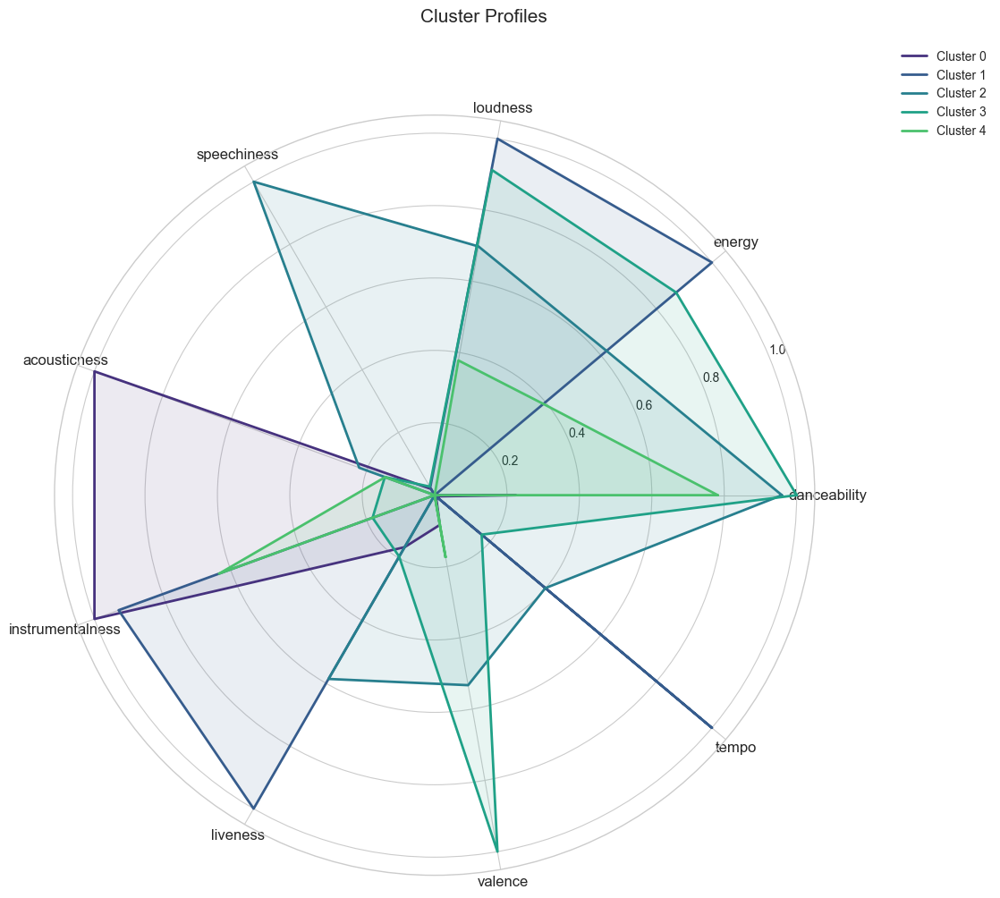


Mean values for each feature by cluster:


,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo
cluster_5,,,,,,,,,
0,0.580363,0.402731,-10.862248,0.075159,0.653481,0.159158,0.162151,0.394848,114.013731
1,0.537893,0.838088,-5.072983,0.076219,0.052604,0.148855,0.259507,0.365308,133.314909
2,0.719800,0.672665,-6.822943,0.319238,0.185841,0.014083,0.211214,0.554279,121.662422
3,0.727516,0.781918,-5.581873,0.077023,0.140553,0.040546,0.165671,0.719872,117.204628
4,0.686227,0.573454,-8.674022,0.070161,0.140027,0.105992,0.142801,0.427675,113.915965


In [25]:
# Calculate mean values for each cluster
cluster_means = df_unique.groupby(f'cluster_{optimal_k}')[cluster_features].mean()

# Create radar chart for cluster profiles
def radar_chart(df, cluster_col, features):
    # Number of variables
    N = len(features)

    # Create a figure with more space for the title
    fig = plt.figure(figsize=(12, 10))

    # Get cluster means and normalize them
    cluster_means = df.groupby(cluster_col)[features].mean()

    # Normalize the data for radar chart
    min_max_scaler = lambda x: (x - x.min()) / (x.max() - x.min())
    cluster_means_norm = cluster_means.apply(min_max_scaler)

    # Angles for each feature
    angles = np.linspace(0, 2*np.pi, N, endpoint=False).tolist()
    angles += angles[:1]  # Close the loop

    # Plot for each cluster
    ax = fig.add_subplot(111, polar=True)

    for cluster in cluster_means_norm.index:
        values = cluster_means_norm.loc[cluster].values.tolist()
        values += values[:1]  # Close the loop
        ax.plot(angles, values, linewidth=2, label=f'Cluster {cluster}')
        ax.fill(angles, values, alpha=0.1)

    # Add feature labels
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(features, size=12)

    # Add legend (move it outside to avoid overlap with title)
    ax.legend(loc='upper left', bbox_to_anchor=(1.1, 1.1), frameon=False)

    # Use figure-level title to avoid overlap with polar plot
    fig.suptitle('Cluster Profiles', fontsize=15, y=1)  # y=1.05 moves title upward

    # Adjust layout to prevent overlap
    plt.tight_layout()

    return fig

# Call the function and display the plot
radar_chart(df_unique, f'cluster_{optimal_k}', cluster_features)
plt.show()

print("\nMean values for each feature by cluster:")
cluster_means

## Enhancements for Clustering Section

### Standardize Features For Clustering

In [26]:
from sklearn.preprocessing import StandardScaler

# Select continuous features for clustering
cluster_features = ['danceability', 'energy', 'loudness', 'speechiness',
                    'acousticness', 'instrumentalness', 'liveness',
                    'valence', 'tempo']

# Create a copy of data for clustering
df_for_clustering = df_unique[cluster_features].copy()

# Apply standardization
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_for_clustering)

### Determine optimal number of clusters with elbow method

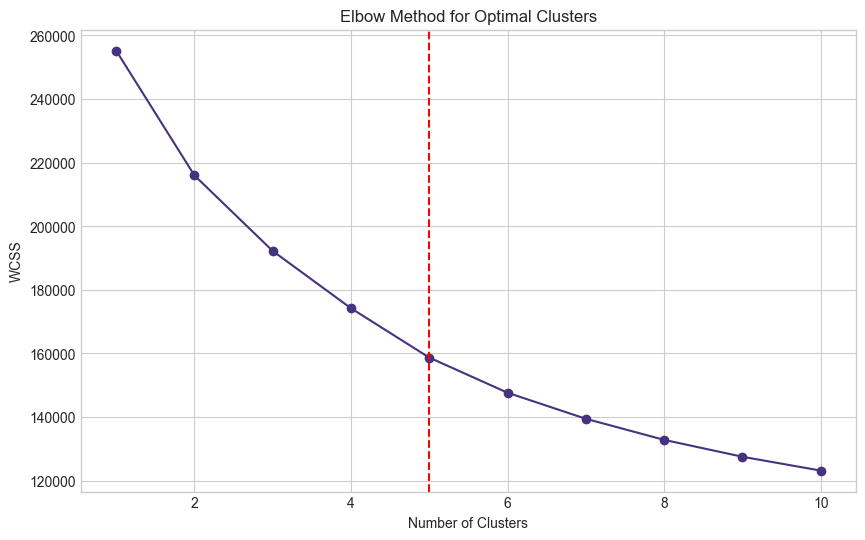

In [27]:
wcss = []
k_range = range(1, 11)
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(df_scaled)
    wcss.append(kmeans.inertia_)

# Plot the elbow curve
plt.figure(figsize=(10, 6))
plt.plot(k_range, wcss, marker='o')
plt.title('Elbow Method for Optimal Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.axvline(x=optimal_k, color='red', linestyle='--')  # Add line at optimal k
plt.show()

### Calculate silhouette scores

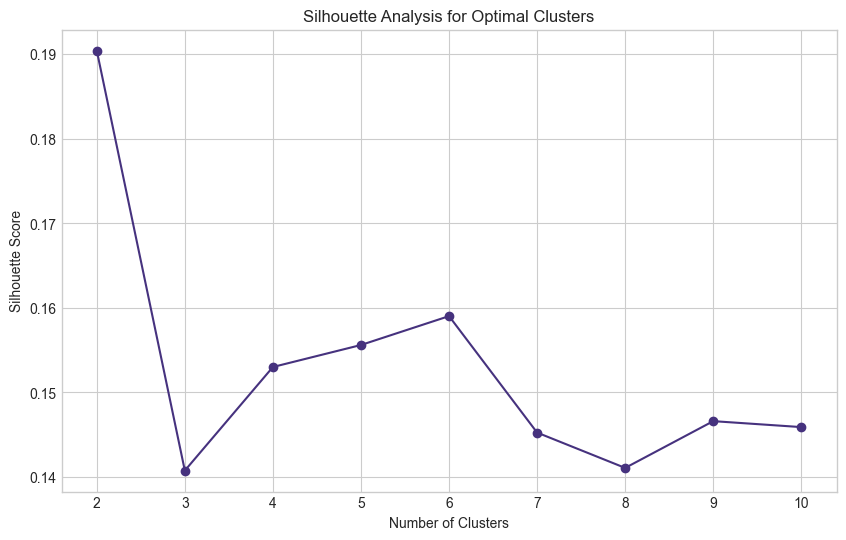

In [28]:
from sklearn.metrics import silhouette_score

silhouette_scores = []
for k in range(2, 11):  # Silhouette requires at least 2 clusters
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    cluster_labels = kmeans.fit_predict(df_scaled)
    silhouette_avg = silhouette_score(df_scaled, cluster_labels)
    silhouette_scores.append(silhouette_avg)

plt.figure(figsize=(10, 6))
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.title('Silhouette Analysis for Optimal Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.show()

### Apply K-means with optimal number of clusters

In [29]:
optimal_k = 5  # Based optimal k from analysis
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
df_unique['cluster'] = kmeans.fit_predict(df_scaled)

### PCA for visualization

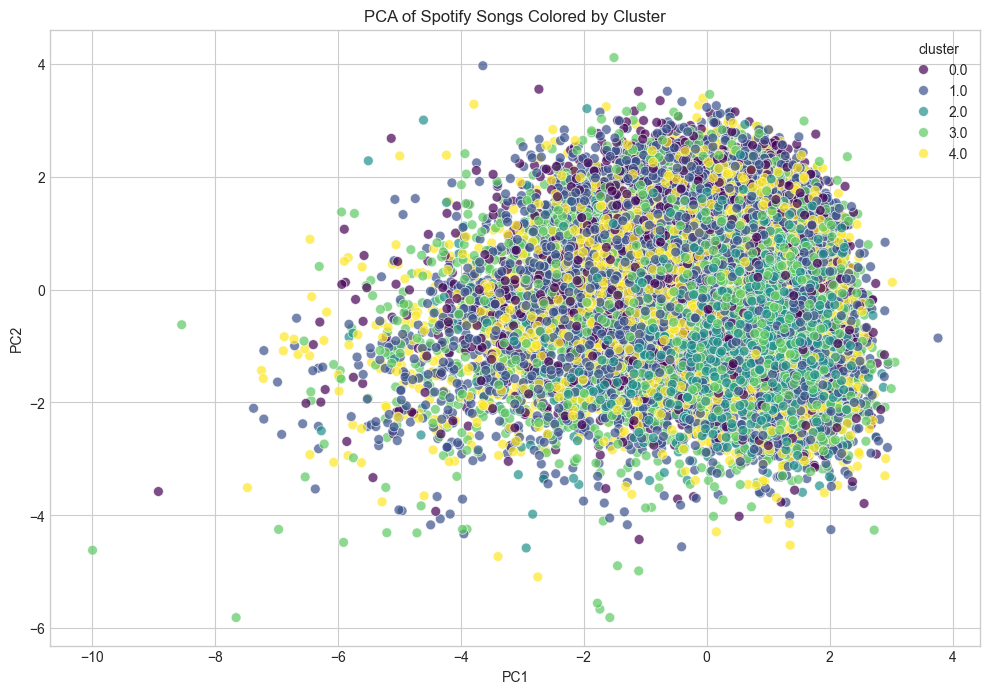

In [30]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
principal_components = pca.fit_transform(df_scaled)

# Create a DataFrame with PCA results
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])
pca_df['cluster'] = df_unique['cluster']
pca_df['high_popularity'] = df_unique['high_popularity']  # Add target variable

# Plot PCA with clusters
plt.figure(figsize=(12, 8))
sns.scatterplot(x='PC1', y='PC2', hue='cluster', data=pca_df, palette='viridis', s=50, alpha=0.7)
plt.title('PCA of Spotify Songs Colored by Cluster')
plt.show()

### Radar chart for cluster centroids

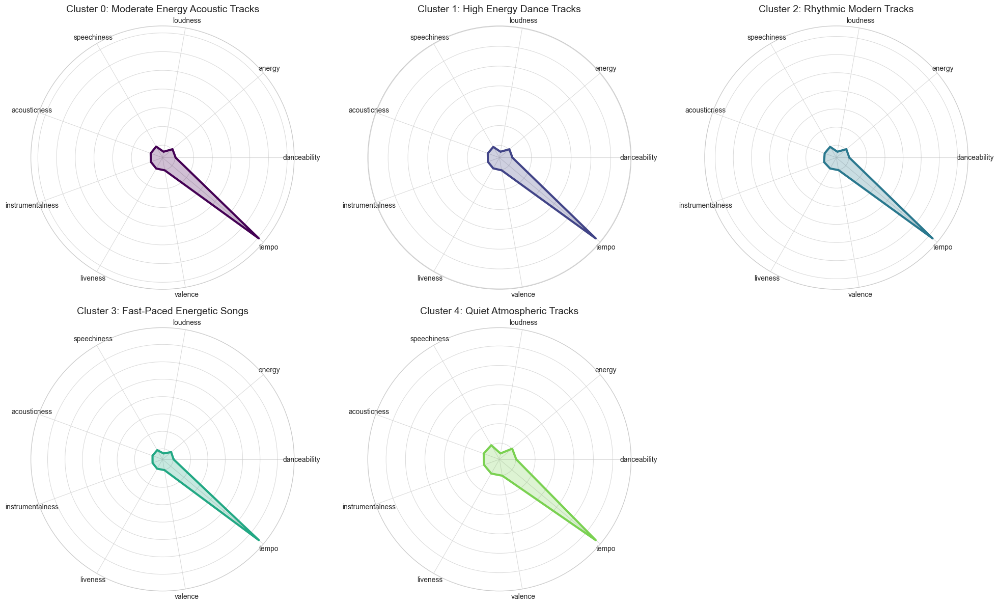

In [31]:
def improved_radar_chart(df, cluster_col, features):
    # Number of variables
    N = len(features)

    # Create angles for radar chart
    angles = [n / float(N) * 2 * np.pi for n in range(N)]
    angles += angles[:1]  # Close the loop

    # Create figure
    fig, ax = plt.subplots(figsize=(14, 10), subplot_kw=dict(polar=True))

    # Add variable labels at the correct positions
    plt.xticks(angles[:-1], features, size=14)

    # Remove redundant text in the center
    ax.set_yticklabels([])

    # Get color map
    colors = plt.cm.viridis(np.linspace(0, 1, len(df[cluster_col].unique())))

    # For each cluster
    for i, cluster in enumerate(sorted(df[cluster_col].unique())):
        # Get values for the cluster
        values = df[df[cluster_col] == cluster][features].mean().values.flatten().tolist()
        values += values[:1]  # Close the loop

        # Plot values
        ax.plot(angles, values, linewidth=3, label=f'Cluster {cluster}', color=colors[i])
        ax.fill(angles, values, alpha=0.25, color=colors[i])

    # Improve legend placement and formatting
    plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1), fontsize=12)
    plt.title('Cluster Profiles Across Audio Features', size=18, pad=20)

    # Add grid
    ax.grid(True, linestyle='-', alpha=0.7)

    return fig, ax

# For individual radar charts with descriptive names
cluster_names = {
    0: "Moderate Energy Acoustic Tracks",
    1: "High Energy Dance Tracks",
    2: "Rhythmic Modern Tracks",
    3: "Fast-Paced Energetic Songs",
    4: "Quiet Atmospheric Tracks"
}

fig, axes = plt.subplots(2, 3, figsize=(20, 12), subplot_kw=dict(polar=True))
axes = axes.flatten()

# Get cluster means for all features
cluster_means = df_unique.groupby('cluster')[cluster_features].mean()

for i, cluster in enumerate(sorted(df_unique['cluster'].unique())):
    if i < 5:  # We have 5 clusters (0-4)
        # Get values for this cluster
        values = cluster_means.loc[cluster].values.tolist()
        values += values[:1]  # Close the loop

        # Create angles
        angles = [n / float(len(cluster_features)) * 2 * np.pi for n in range(len(cluster_features))]
        angles += angles[:1]

        # Plot on the appropriate subplot
        axes[i].plot(angles, values, linewidth=3, color=plt.cm.viridis(i/5))
        axes[i].fill(angles, values, alpha=0.25, color=plt.cm.viridis(i/5))
        axes[i].set_xticks(angles[:-1])
        axes[i].set_xticklabels(cluster_features, size=10)

        # Move title higher by adding vertical space
        axes[i].set_title(f'Cluster {cluster}: {cluster_names[cluster]}', size=14, pad=20)

        # Remove redundant y-labels
        axes[i].set_yticklabels([])

        axes[i].grid(True, linestyle='-', alpha=0.7)

# Remove the empty subplot if there is one
if len(axes) > 5:
    fig.delaxes(axes[5])

# Add more space between subplots to prevent overlap
plt.subplots_adjust(hspace=0.5, wspace=0.3)
plt.tight_layout()
plt.show()

### Analyze relationship between clusters and popularity

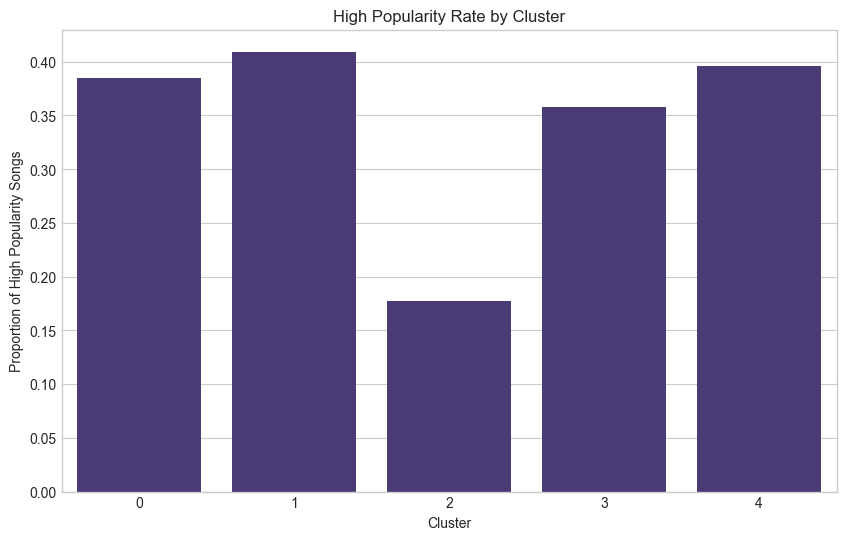

In [32]:
plt.figure(figsize=(10, 6))
cluster_popularity = df_unique.groupby('cluster')['high_popularity'].mean().sort_values()
sns.barplot(x=cluster_popularity.index, y=cluster_popularity.values)
plt.title('High Popularity Rate by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Proportion of High Popularity Songs')
plt.show()

### Analyze relationship between clusters and genres

<Figure size 1400x800 with 0 Axes>

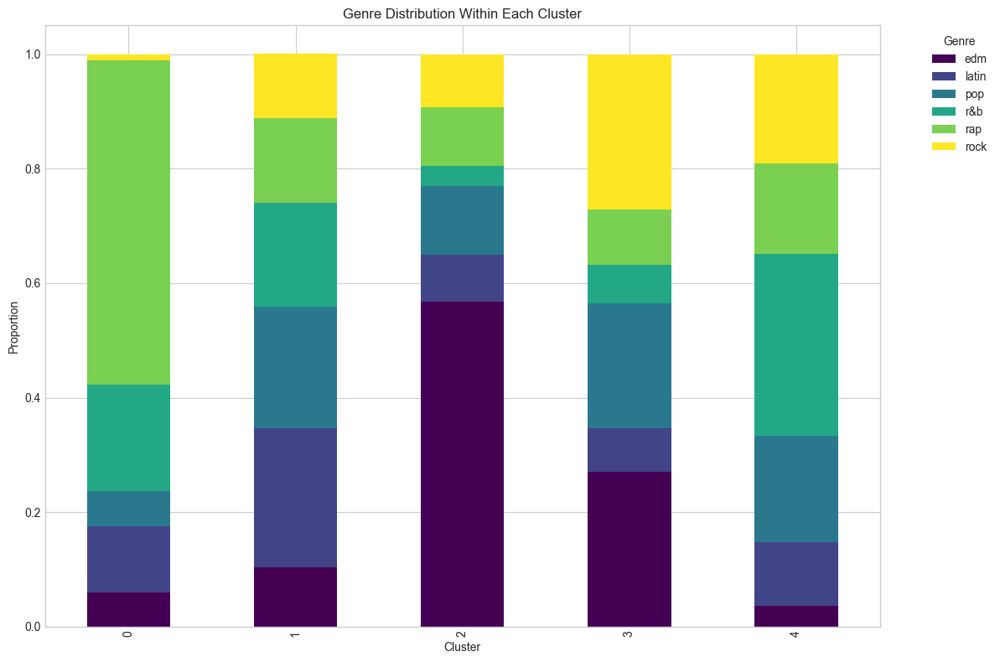

In [33]:
cluster_genre_counts = pd.crosstab(df_unique['cluster'], df_unique['playlist_genre'])
cluster_genre_proportions = cluster_genre_counts.div(cluster_genre_counts.sum(axis=1), axis=0)

plt.figure(figsize=(14, 8))
cluster_genre_proportions.plot(kind='bar', stacked=True, colormap='viridis')
plt.title('Genre Distribution Within Each Cluster')
plt.xlabel('Cluster')
plt.ylabel('Proportion')
plt.legend(title='Genre', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

### Statistical analysis of features across clusters

In [34]:
from scipy import stats

# ANOVA test for each feature across clusters
anova_results = {}
for feature in cluster_features:
    groups = [df_unique[df_unique['cluster'] == c][feature].values for c in range(optimal_k)]
    f_stat, p_val = stats.f_oneway(*groups)
    anova_results[feature] = {'F-statistic': f_stat, 'p-value': p_val}

anova_df = pd.DataFrame(anova_results).T
print("ANOVA Results - Feature Differences Across Clusters:")
anova_df.sort_values('F-statistic', ascending=False)

ANOVA Results - Feature Differences Across Clusters:


,F-statistic,p-value
instrumentalness,20264.451411,0.0
speechiness,14025.735990,0.0
energy,5858.846728,0.0
acousticness,5823.492585,0.0
danceability,3483.922514,0.0
loudness,3149.102229,0.0
valence,3138.404513,0.0
tempo,665.022723,0.0
liveness,489.313729,0.0


### Summary statistics for each cluster

In [35]:
cluster_summary = df_unique.groupby('cluster')[cluster_features].agg(['mean', 'std'])
print("\nCluster Centers and Standard Deviations:")
cluster_summary


Cluster Centers and Standard Deviations:


danceability              energy             loudness            \
                mean       std      mean       std       mean       std   
cluster                                                                   
0           0.722952  0.129918  0.668553  0.146334  -6.878062  2.483466   
1           0.735207  0.092706  0.725459  0.129505  -6.331362  2.351607   
2           0.663156  0.134057  0.780708  0.173577  -7.048081  2.956090   
3           0.539940  0.121790  0.803698  0.123573  -5.291244  1.941646   
4           0.600227  0.147763  0.425210  0.137383 -10.557543  3.471849   

        speechiness           acousticness           instrumentalness  \
               mean       std         mean       std             mean   
cluster                                                                 
0          0.314524  0.092188     0.183070  0.181395         0.010738   
1          0.074967  0.045682     0.139771  0.148436         0.016098   
2          0.072036  0.052748     0.075076  0.144882         0.749271   
3          0.074730  0.051728     0.065637  0.103309         0.025829   
4          0.072283  0.065026     0.519056  0.260608         0.096779   

                   liveness             valence                 tempo  \
              std      mean       std      mean       std        mean   
cluster                                                                 
0        0.066909  0.207535  0.162052  0.548886  0.196799  121.074193   
1        0.059342  0.155044  0.113884  0.671738  0.181251  114.501240   
2        0.152732  0.189666  0.165304  0.390292  0.252466  125.007537   
3        0.074823  0.247832  0.191371  0.386760  0.184266  132.397685   
4        0.239979  0.155637  0.119237  0.391738  0.207203  112.685407   

                    
               std  
cluster             
0        33.712518  
1        21.590821  
2        18.070972  
3        26.411935  
4        28.451774